In [4]:
## Basic PyTorch functionality
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

## CPU data structures
import pandas as pd
import numpy as np

## Public datasets
import torchvision.datasets as datasets
import torchvision.transforms as transforms

## Image processing
from PIL import Image

## Classical ML-frameworks
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB

## Pretrained models
from torchvision.models import resnet18, ResNet18_Weights
import timm

## Plotting
import matplotlib.pyplot as plt

## Custom modules
import jm_pytorch_tutorials as jpt
from jm_pytorch_tutorials.models import ResNet18Classifier, ViTClassifier, ConvNeXtClassifier

In [2]:
# Hyperparameters for session
batch_size = 64
device = jpt.utils.get_device()
print(f"Using device: {device}")

Using device: mps


In [5]:
## Init three pretrained models
torch_models = {
    "ResNet_pretrained": ResNet18Classifier(),
    "ViT_pretrained": ViTClassifier(),
    "ConvNeXT_pretrained": ConvNeXtClassifier()
}

In [6]:
## Pass whatever image in
image = Image.open("./data/misc_jpegs/bbc_hammerhead.jpg").convert("RGB")  # Always convert to RGB
# Define the transform
to_tensor = transforms.ToTensor()
# Apply the transform
image_tensor = to_tensor(image)  # shape: [3, H, W], dtype: torch.float32 in [0, 1]

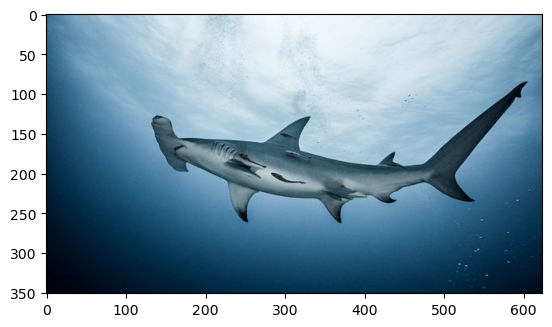

In [7]:
plt.imshow(image)

In [12]:
for name, model_class in torch_models.items():
    with torch.no_grad():
        x = model_class.transform(image_tensor).unsqueeze(0)
        output = model_class.forward(x)
        model_class.probs = torch.nn.functional.softmax(output[0], dim=0)

In [13]:
from torchvision.models import ResNet18_Weights
categories = ResNet18_Weights.DEFAULT.meta["categories"]

for name, model_class in torch_models.items():
    model_class.top5_predictions = torch.topk(model_class.probs, 5)

In [14]:
for name, model_class in torch_models.items():
    print(f"\nTop 5 predictions from {name}")
    for i, idx in enumerate(model_class.top5_predictions.indices):
        print(f"{i+1}: {categories[idx]} ({model_class.probs[idx]*100:.2f}%)")


Top 5 predictions from ResNet_pretrained
1: hammerhead (86.06%)
2: great white shark (7.30%)
3: tiger shark (6.55%)
4: warplane (0.06%)
5: wing (0.01%)

Top 5 predictions from ViT_pretrained
1: hammerhead (76.10%)
2: tiger shark (8.59%)
3: great white shark (0.94%)
4: electric ray (0.06%)
5: scuba diver (0.06%)

Top 5 predictions from ConvNeXT_pretrained
1: hammerhead (89.66%)
2: tiger shark (4.70%)
3: great white shark (0.56%)
4: electric ray (0.08%)
5: barracouta (0.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5877128].


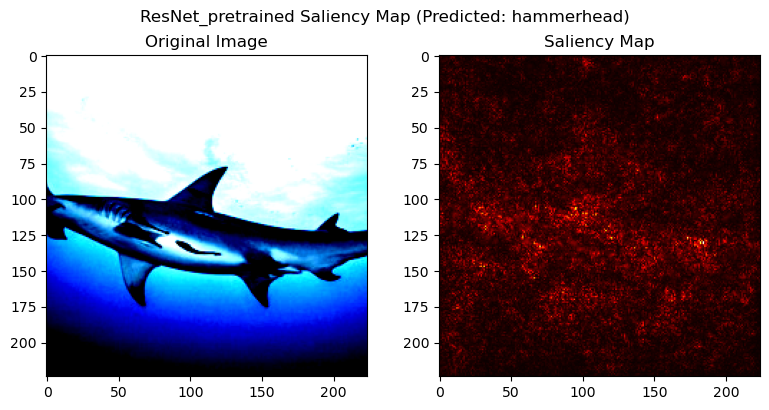

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9843137].


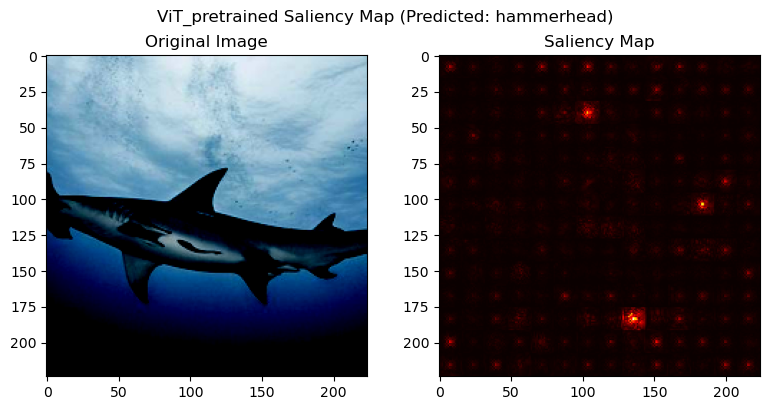

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416].


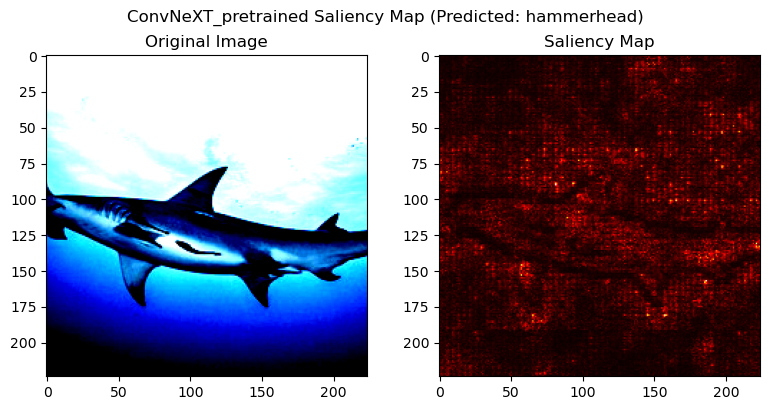

In [15]:
for name, model_class in torch_models.items():
    # Transform the image with the model's transform
    image_transformed = model_class.transform(image)
    
    # Compute saliency for top predicted class
    saliency, predicted_class = jpt.compute_saliency_map(model_class.model, image_transformed, label=None)
    
    # Plot
    jpt.plot_saliency_map(image_transformed, saliency, title=f"{name} Saliency Map (Predicted: {categories[predicted_class]})")

In [16]:
def get_feature_maps(model, image_tensor, layer_name="conv1"):
    """
    Extract activation maps from a named layer.
    image_tensor: [1, 3, H, W]
    """
    model.eval()
    activations = {}

    def hook_fn(module, input, output):
        activations["maps"] = output.detach()

    handle = dict(model.named_modules())[layer_name].register_forward_hook(hook_fn)
    _ = model(image_tensor)
    handle.remove()
    return activations["maps"].squeeze(0)  # shape: [num_filters, H, W]

def plot_feature_maps(input_image, maps, title="Conv Activations"):
    """
    input_image: [3, H, W] Tensor (unnormalized)
    maps: [N, H, W] Tensor
    """
    import matplotlib.pyplot as plt

    num_maps = maps.shape[0]
    num_cols = 8
    num_rows = (num_maps + 1 + num_cols - 1) // num_cols  # +1 for input

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 1.5, num_rows * 1.5))
    axes = axes.flatten()

    # Input image
    img = input_image.permute(1, 2, 0).cpu().numpy()
    axes[0].imshow(img)
    axes[0].set_title("Input")
    axes[0].axis('off')

    for i in range(num_maps):
        axes[i + 1].imshow(maps[i].cpu(), cmap='viridis')
        axes[i + 1].axis('off')

    for j in range(num_maps + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def register_hooks(model, layer_names, hook_outputs):
    """
    Register forward hooks to specified layers in a model to capture outputs.

    Args:
        model (nn.Module): The model to register hooks on.
        layer_names (list[str]): Dot-separated names of layers (e.g., 'blocks.0.attn').
        hook_outputs (dict): Dictionary to store hook outputs.
    """
    def get_submodule(model, layer_name):
        parts = layer_name.split('.')
        for part in parts:
            if part.isdigit():
                model = model[int(part)]
            else:
                model = getattr(model, part)
        return model

    hooks = []
    for name in layer_names:
        module = get_submodule(model, name)
        hook = module.register_forward_hook(
            lambda m, i, o, n=name: hook_outputs.setdefault(n, o.detach().cpu()))
        hooks.append(hook)
    return hooks


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5877128].



Plotting activation maps for ResNet_pretrained


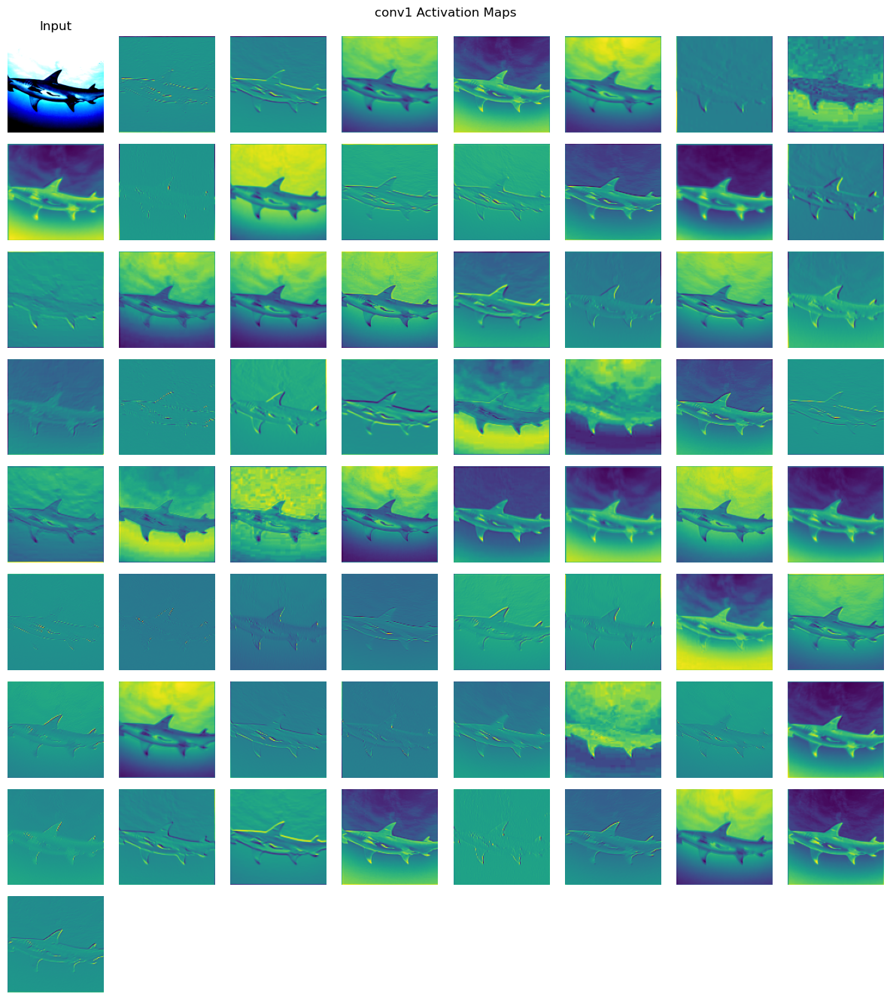

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5877128].


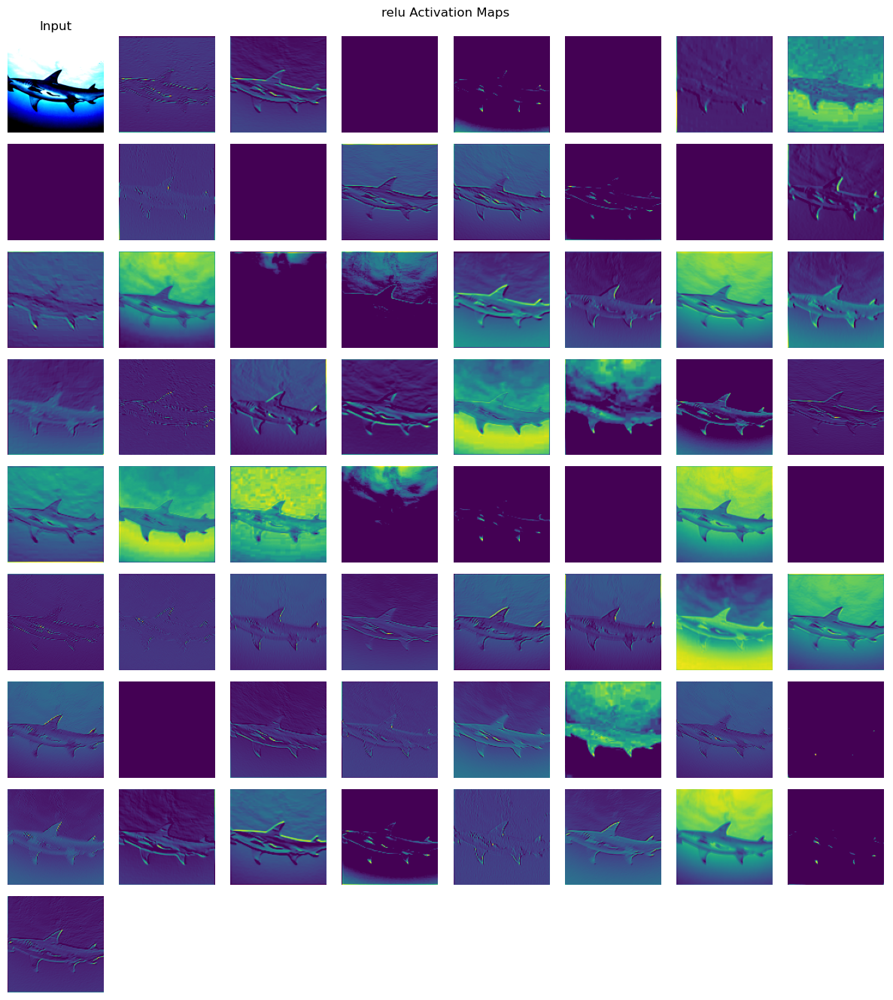

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5877128].


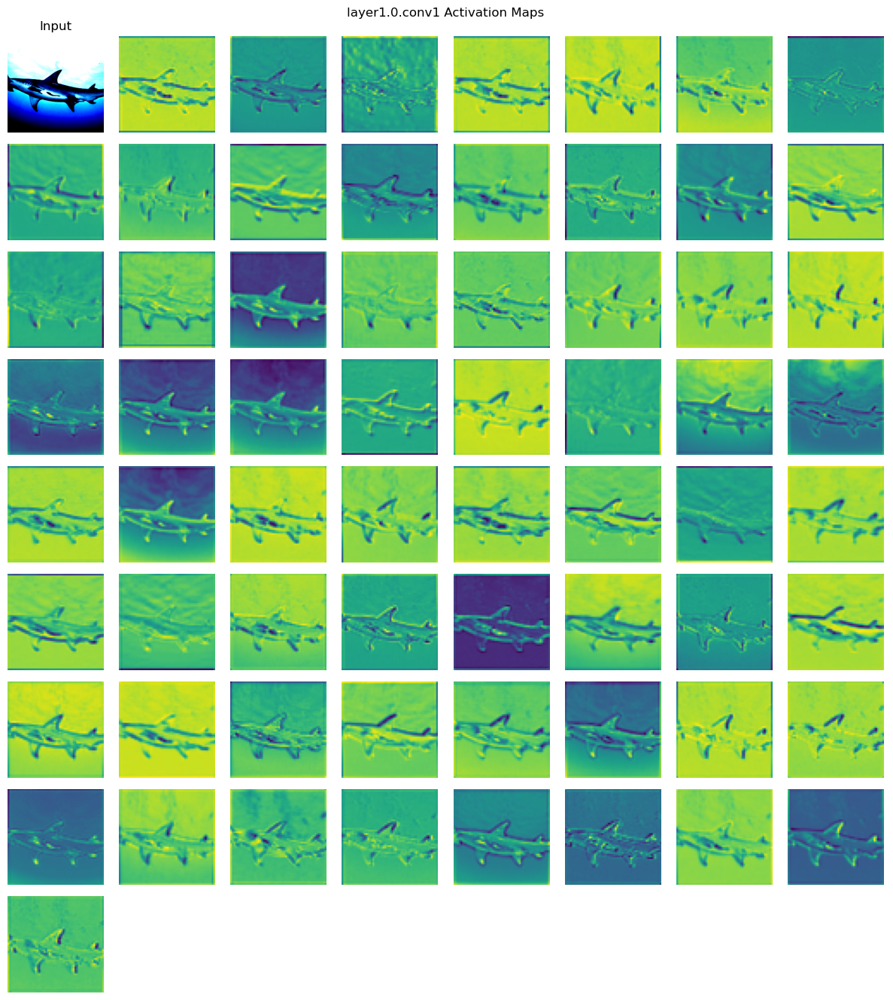

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5877128].


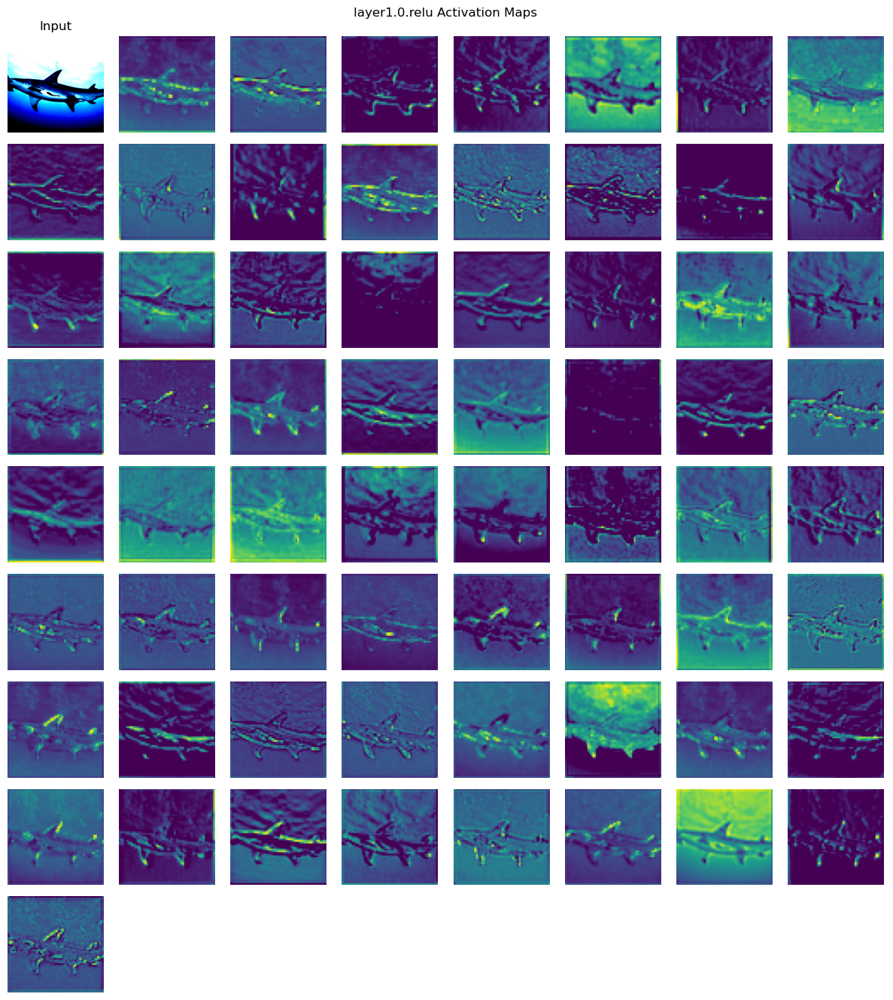


Plotting activation maps for ConvNeXT_pretrained


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416].


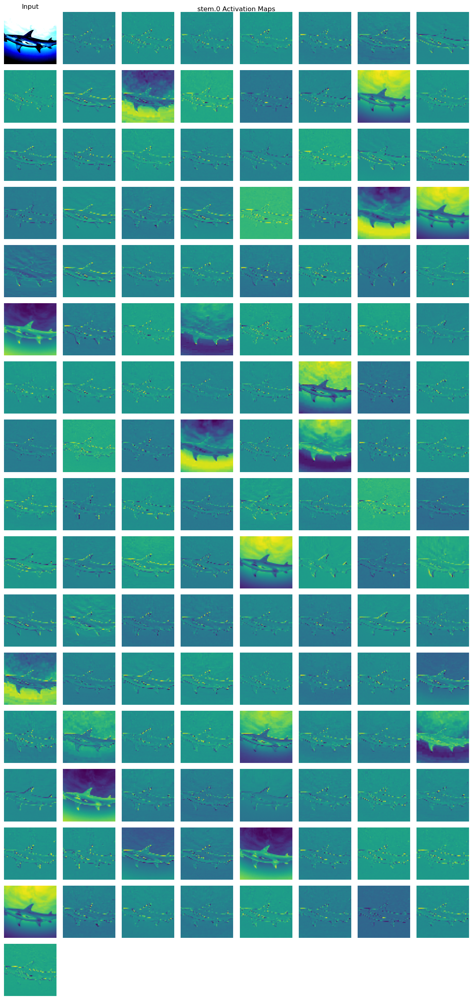

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416].


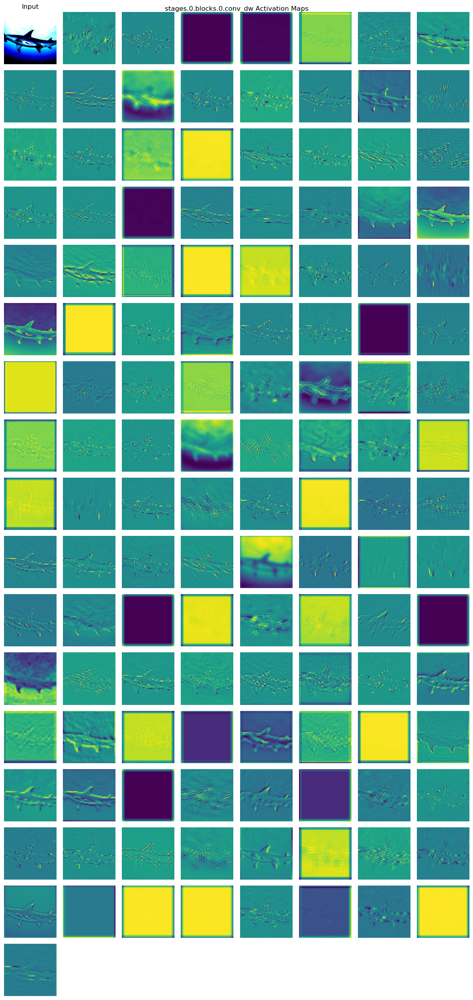

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416].


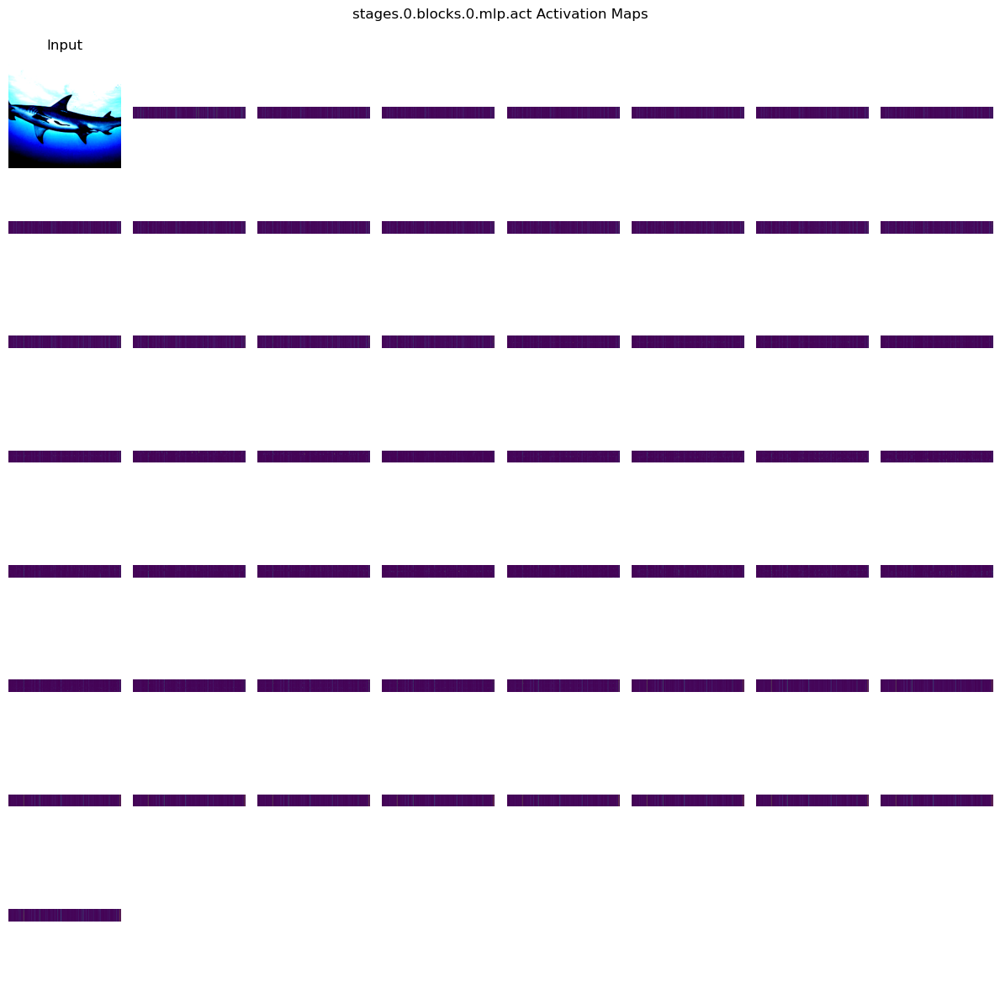

In [17]:
for name, model_class in torch_models.items():
    if name == 'ViT_pretrained':
        pass
    else:
        print(f"\nPlotting activation maps for {name}")
        # Transform the image with the model's transform
        image_transformed = model_class.transform(image)
        for layer in model_class.layers_to_track:
            act_maps = get_feature_maps(model_class.model, image_transformed.unsqueeze(0), layer_name=layer)
            plot_feature_maps(image_transformed, act_maps, title=f"{layer} Activation Maps")

In [47]:
torch_models.keys()

dict_keys(['ResNet_pretrained', 'ViT_pretrained', 'ConvNeXT_pretrained'])

In [18]:
hook_outputs = {}
model_instance = torch_models['ViT_pretrained']
model_instance.model.eval()

# Register hooks
hooks = register_hooks(model_instance.model, model_instance.layers_to_track, hook_outputs)

# Forward pass to populate hook_outputs
with torch.no_grad():
    _ = model_instance(image_transformed.unsqueeze(0))

# Access attention or feature map from hook_outputs:
attn_output = hook_outputs['blocks.0.attn']  # Example: [1, 12, 197, 197]

In [19]:
def extract_attention_weights(model, layer_index=0):
    """
    Registers a forward hook to extract raw attention weights from ViT.
    Returns a dictionary with attention maps [heads, tokens, tokens]
    """
    attn_maps = {}

    def hook_fn(module, input, output):
        # output: [batch, tokens, dim], we want to recompute attention weights
        B, N, C = input[0].shape  # input to attention layer
        qkv = module.qkv(input[0])  # [B, N, 3 * dim]
        qkv = qkv.reshape(B, N, 3, module.num_heads, C // module.num_heads)
        qkv = qkv.permute(2, 0, 3, 1, 4)  # 3, B, num_heads, N, head_dim
        q, k, v = qkv[0], qkv[1], qkv[2]  # each is [B, num_heads, N, head_dim]

        attn = (q @ k.transpose(-2, -1)) * module.scale  # [B, heads, N, N]
        attn = attn.softmax(dim=-1)
        attn_maps['attn'] = attn.detach().cpu()

    handle = model.blocks[layer_index].attn.register_forward_hook(hook_fn)
    return attn_maps, handle


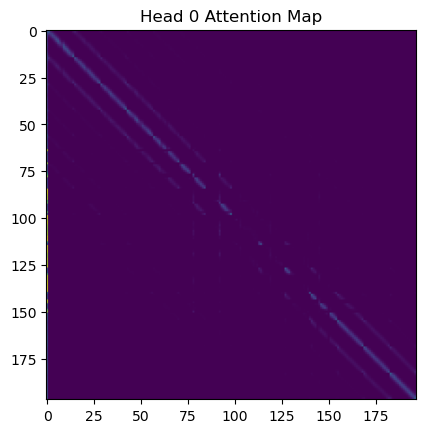

In [20]:
model = torch_models['ViT_pretrained'].model
attn_maps, handle = extract_attention_weights(model, layer_index=0)

# Forward pass
_ = model(image_transformed.unsqueeze(0))

# Access attention weights
attn = attn_maps['attn'][0]  # shape [num_heads, tokens, tokens]

# Visualize attention of [head=0]
plt.imshow(attn[0], cmap='viridis')
plt.title("Head 0 Attention Map")
plt.show()

# Don't forget to remove hook
handle.remove()

In [21]:
def get_patch_attention(attn, token_index=0):
    """
    Extract attention from [CLS] token to all patches.

    Parameters:
        attn (Tensor): shape [num_heads, tokens, tokens]
        token_index (int): usually 0 for CLS → patches

    Returns:
        Tensor of shape [num_heads, h, w]
    """
    num_heads, tokens, _ = attn.shape
    num_patches = tokens - 1  # exclude CLS
    h = w = int(num_patches ** 0.5)
    attn_patches = attn[:, token_index, 1:].reshape(num_heads, h, w)  # remove CLS token from output
    return attn_patches

def overlay_attention(image, attn_map, alpha=0.5):
    """
    Overlay attention map onto an image.

    Parameters:
        image (Tensor): [3, H, W], normalized image
        attn_map (Tensor): [h, w], attention for one head
        alpha (float): blending factor
    """
    import matplotlib.pyplot as plt

    img = image.clone()
    if img.max() <= 1:
        img = img * 255
    img = img.permute(1, 2, 0).byte().numpy()

    # Upsample attention to image size
    attn = F.interpolate(attn_map.unsqueeze(0).unsqueeze(0), size=img.shape[:2], mode='bilinear', align_corners=False)
    attn = attn.squeeze().cpu().numpy()
    attn = (attn - attn.min()) / (attn.max() - attn.min())  # normalize

    # Blend
    cmap = plt.get_cmap('jet')
    attn_color = cmap(attn)[..., :3]  # RGB
    attn_overlay = (1 - alpha) * img / 255. + alpha * attn_color

    # Plot
    plt.figure(figsize=(5, 5))
    plt.imshow(attn_overlay)
    plt.axis('off')
    plt.title("Attention Overlay")
    plt.show()

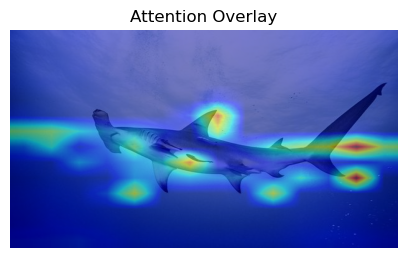

In [22]:
# Assume `attn` is [num_heads, 197, 197]
attn_patches = get_patch_attention(attn)  # [num_heads, 14, 14]

# Choose one head to visualize
overlay_attention(image_tensor, attn_patches[0])